<details>
<summary><b>Info</b></summary>

**Last Execution:** 2026-07-27

| Package | Version |
|---------|---------|
| **nnsight** | **0.8** |
| Python | 3.12.13 |
| torch | 2.13.0+cu126 |
| diffusers | 0.39.0 |

</details>


# Diffusion Lens
## Introduction

🔎 The **diffusion lens** peers inside the *text encoder* of a text-to-image model. It was introduced by Michael Toker in *Diffusion Lens: Interpreting Text Encoders in Text-to-Image Pipelines* ([project website](https://tokeron.github.io/DiffusionLensWeb/), [ACL paper](https://aclanthology.org/2024.acl-long.524/)).

> **Colab: [exercises](https://colab.research.google.com/github/ndif-team/nnsight-website/blob/docs/source/notebooks/tutorials/probing/diffusion_lens.ipynb)**

A text-to-image model works in two stages: a **text encoder** turns the prompt into an embedding, and a **denoiser** (UNet or diffusion transformer) uses that embedding to generate an image. Normally we only ever see the image produced from the encoder's *final* embedding. The diffusion lens asks a question analogous to the [logit lens](logit_lens.ipynb) for language models: *what has the text encoder represented so far, partway through its layers?*

The trick is to intercept an intermediate encoder layer, push its hidden state straight into the encoder's final layer norm — skipping the remaining layers — and let the denoiser render an image from that early embedding. Sweeping the intercept point from shallow to deep produces a sequence of images that shows the prompt's meaning assembling layer by layer.

This is a natural fit for NNsight: we [get](../../../features/1_getting.ipynb) a hidden state from one module and [set](../../../features/2_setting.ipynb) it as another module's input, all inside a single generation.

![Compound Prompt Example](https://tokeron.github.io/DiffusionLensWeb/static/images/encoders.png)
**Text encoders differ in how they build a prompt (Toker et al.):** for a compound prompt with two nouns, the paper found that **CLIP** encoders tend to represent the *first* noun first, while **T5** encoders tend to represent the *second* noun first. They also observed that common concepts are embedded in earlier layers than uncommon ones.

Let's reproduce this with NNsight. Our test prompt, `"A few people are in the ocean splashing around"`, has two nouns — *people* and *ocean*. We'll run the diffusion lens on Stable Diffusion 1.5 (CLIP encoder) and, as bonuses, SDXL (two CLIP encoders) and FLUX (CLIP + a T5 encoder), and watch the order in which each builds the scene. (Deep Floyd, the paper's headline T5 model, is a gated repo — see its section below.)

## Setup

If you are running in Colab, install NNsight and connect to a GPU. Note that a free Colab T4 only has enough memory for one of these models at a time — restart the runtime and re-run this Setup section before moving to the next model. Running locally on a single larger GPU, the notebook clears each model from memory before loading the next, so you can run straight through.

In [1]:
from IPython.display import clear_output
import torch
try:
    import google.colab
    is_colab = True
    if torch.cuda.is_available():
        print("GPU is connected")
    else:
        print("GPU is not connected: Please restart session with a GPU")

except ImportError:
    is_colab = False

if is_colab:
    !pip install -U nnsight
    !pip install ftfy
    pass

clear_output()

We drive everything through NNsight's `DiffusionModel`, which wraps a `diffusers` pipeline and exposes each component — text encoder(s), UNet/transformer, VAE — as an addressable module you can read from and write to inside a trace.

In [2]:
import gc
import PIL
import matplotlib.pyplot as plt
from math import ceil, sqrt
from nnsight.modeling.diffusion import DiffusionModel


def free_memory(*names):
    """Drop a model and reclaim GPU memory before loading the next one."""
    for name in names:
        if name in globals():
            del globals()[name]
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


def show_grid(images, layers, title, thumb=256):
    """Plot the diffusion-lens images in a labelled grid."""
    n = len(images)
    if n == 0:
        print("No images to show.")
        return
    cols = ceil(sqrt(n))
    rows = ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten() if n > 1 else [axes]
    fig.suptitle(title, fontsize=16)
    for ax, layer, image in zip(axes, layers, images):
        ax.imshow(image.resize((thumb, thumb)))
        ax.set_title(f"Layer {layer}")
        ax.axis("off")
    for ax in axes[n:]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()

/home/localjadenfk/miniconda3/envs/ndif2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


> 💡 The diffusion lens is a *get*-then-*set* intervention. If `model.generate()`, reading a module's `.output`, and assigning to a module's `.input` are unfamiliar, the [Walkthrough](../../../features/1_getting.ipynb) and [Setting values](../../../features/2_setting.ipynb) tutorials cover the mechanics.

## Stable Diffusion 1.5 (CLIP encoder)

### Load Model

Stable Diffusion 1.5 encodes text with a single CLIP encoder. We load it with `dispatch=True` so the weights are placed on the GPU immediately. We pass `safety_checker=None`: the checker occasionally blanks a benign image to black, which would break the layer-by-layer comparison — appropriate here since we are auditing the model's internals, not serving images.

In [3]:
model = DiffusionModel(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    safety_checker=None,
    dispatch=True,
).to("cuda")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:  50%|█████     | 3/6 [00:00<00:00, 21.90it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  8.30it/s]


You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [4]:
SEED = 17       # generation seed — change it to see how robust the pattern is
STEP_SIZE = 1   # sweep every Nth encoder layer

In [5]:
prompt = "A few people are in the ocean splashing around"

### Run Diffusion Lens

For each encoder layer we open a generation, read that layer's output hidden state, and feed it into the encoder's `final_layer_norm` — bypassing every later layer. The denoiser then renders whatever image that early embedding implies.

CLIP's encoder layers live at `model.text_encoder.encoder.layers`, and each layer returns its hidden-state tensor directly, so `.output` is what we want. We save the whole pipeline result with `model.output.save()` and pull the image out after the generation finishes. A traced `model.generate()` denoises once by default, so we pass `num_inference_steps` explicitly to get a fully denoised image at each layer.

In [6]:
layers = range(0, model.text_encoder.config.num_hidden_layers, STEP_SIZE)
images = []

for layer in layers:
    print(f"Generating from CLIP layer {layer}")
    with model.generate(prompt, num_inference_steps=50, seed=SEED):
        # Route this layer's hidden state straight into the final layer norm.
        hidden_state = model.text_encoder.encoder.layers[layer].output
        model.text_encoder.final_layer_norm.input = hidden_state

        result = model.output.save()
    images.append(result.images[0])

Generating from CLIP layer 0


  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:00<00:10,  4.69it/s]

  8%|▊         | 4/50 [00:00<00:03, 14.16it/s]

 14%|█▍        | 7/50 [00:00<00:02, 19.03it/s]

 20%|██        | 10/50 [00:00<00:01, 21.70it/s]

 26%|██▌       | 13/50 [00:00<00:01, 23.34it/s]

 32%|███▏      | 16/50 [00:00<00:01, 24.08it/s]

 38%|███▊      | 19/50 [00:00<00:01, 24.83it/s]

 44%|████▍     | 22/50 [00:01<00:01, 25.60it/s]

 50%|█████     | 25/50 [00:01<00:00, 26.14it/s]

 56%|█████▌    | 28/50 [00:01<00:00, 26.38it/s]

 62%|██████▏   | 31/50 [00:01<00:00, 26.75it/s]

 68%|██████▊   | 34/50 [00:01<00:00, 26.72it/s]

 74%|███████▍  | 37/50 [00:01<00:00, 26.56it/s]

 80%|████████  | 40/50 [00:01<00:00, 26.62it/s]

 86%|████████▌ | 43/50 [00:01<00:00, 26.82it/s]

 92%|█████████▏| 46/50 [00:01<00:00, 26.98it/s]

 98%|█████████▊| 49/50 [00:02<00:00, 27.07it/s]

100%|██████████| 50/50 [00:02<00:00, 24.54it/s]

Generating from CLIP layer 1


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

 10%|█         | 5/50 [00:00<00:01, 23.35it/s]

 16%|█▌        | 8/50 [00:00<00:01, 25.28it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.97it/s]

 28%|██▊       | 14/50 [00:00<00:01, 26.51it/s]

 34%|███▍      | 17/50 [00:00<00:01, 26.71it/s]

 40%|████      | 20/50 [00:00<00:01, 26.88it/s]

 46%|████▌     | 23/50 [00:00<00:01, 27.00it/s]

 52%|█████▏    | 26/50 [00:00<00:00, 27.15it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 27.19it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 27.06it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.88it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 26.74it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 26.83it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 26.86it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 26.82it/s]

100%|██████████| 50/50 [00:01<00:00, 26.94it/s]

100%|██████████| 50/50 [00:01<00:00, 26.53it/s]

Generating from CLIP layer 2


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.02it/s]

 10%|█         | 5/50 [00:00<00:01, 22.82it/s]

 16%|█▌        | 8/50 [00:00<00:01, 24.84it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.53it/s]

 28%|██▊       | 14/50 [00:00<00:01, 25.61it/s]

 34%|███▍      | 17/50 [00:00<00:01, 25.82it/s]

 40%|████      | 20/50 [00:00<00:01, 25.98it/s]

 46%|████▌     | 23/50 [00:00<00:01, 25.62it/s]

 52%|█████▏    | 26/50 [00:01<00:00, 25.94it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 26.25it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 26.45it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.63it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 26.52it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 26.48it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 26.46it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 25.82it/s]

100%|██████████| 50/50 [00:01<00:00, 25.90it/s]

100%|██████████| 50/50 [00:01<00:00, 25.77it/s]

Generating from CLIP layer 3


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 17.05it/s]

 10%|█         | 5/50 [00:00<00:01, 22.78it/s]

 16%|█▌        | 8/50 [00:00<00:01, 24.46it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.06it/s]

 28%|██▊       | 14/50 [00:00<00:01, 25.50it/s]

 34%|███▍      | 17/50 [00:00<00:01, 26.06it/s]

 40%|████      | 20/50 [00:00<00:01, 26.21it/s]

 46%|████▌     | 23/50 [00:00<00:01, 26.35it/s]

 52%|█████▏    | 26/50 [00:01<00:00, 26.70it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 26.78it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 26.73it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.93it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 27.02it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 27.08it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 27.07it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 27.08it/s]

100%|██████████| 50/50 [00:01<00:00, 27.04it/s]

100%|██████████| 50/50 [00:01<00:00, 26.26it/s]

Generating from CLIP layer 4


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.15it/s]

 10%|█         | 5/50 [00:00<00:01, 22.97it/s]

 16%|█▌        | 8/50 [00:00<00:01, 24.65it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.41it/s]

 28%|██▊       | 14/50 [00:00<00:01, 25.78it/s]

 34%|███▍      | 17/50 [00:00<00:01, 24.55it/s]

 40%|████      | 20/50 [00:00<00:01, 22.39it/s]

 46%|████▌     | 23/50 [00:01<00:01, 20.93it/s]

 52%|█████▏    | 26/50 [00:01<00:01, 20.43it/s]

 58%|█████▊    | 29/50 [00:01<00:01, 20.07it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 19.86it/s]

 70%|███████   | 35/50 [00:01<00:00, 19.59it/s]

 74%|███████▍  | 37/50 [00:01<00:00, 19.42it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 19.14it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 19.07it/s]

 88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

 92%|█████████▏| 46/50 [00:02<00:00, 19.27it/s]

 96%|█████████▌| 48/50 [00:02<00:00, 19.14it/s]

100%|██████████| 50/50 [00:02<00:00, 19.15it/s]

100%|██████████| 50/50 [00:02<00:00, 20.60it/s]

Generating from CLIP layer 5


  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

  6%|▌         | 3/50 [00:00<00:03, 15.17it/s]

 10%|█         | 5/50 [00:00<00:02, 16.95it/s]

 14%|█▍        | 7/50 [00:00<00:02, 17.72it/s]

 18%|█▊        | 9/50 [00:00<00:02, 18.05it/s]

 22%|██▏       | 11/50 [00:00<00:02, 18.49it/s]

 26%|██▌       | 13/50 [00:00<00:01, 18.66it/s]

 30%|███       | 15/50 [00:00<00:01, 18.89it/s]

 34%|███▍      | 17/50 [00:00<00:01, 18.97it/s]

 38%|███▊      | 19/50 [00:01<00:01, 18.98it/s]

 42%|████▏     | 21/50 [00:01<00:01, 19.05it/s]

 46%|████▌     | 23/50 [00:01<00:01, 19.14it/s]

 50%|█████     | 25/50 [00:01<00:01, 18.83it/s]

 54%|█████▍    | 27/50 [00:01<00:01, 19.11it/s]

 60%|██████    | 30/50 [00:01<00:00, 20.22it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 22.21it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 23.55it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.35it/s]

 84%|████████▍ | 42/50 [00:02<00:00, 24.95it/s]

 90%|█████████ | 45/50 [00:02<00:00, 25.17it/s]

 96%|█████████▌| 48/50 [00:02<00:00, 25.60it/s]

100%|██████████| 50/50 [00:02<00:00, 21.18it/s]

Generating from CLIP layer 6


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 17.24it/s]

 10%|█         | 5/50 [00:00<00:02, 22.05it/s]

 16%|█▌        | 8/50 [00:00<00:01, 23.66it/s]

 22%|██▏       | 11/50 [00:00<00:01, 23.74it/s]

 28%|██▊       | 14/50 [00:00<00:01, 24.42it/s]

 34%|███▍      | 17/50 [00:00<00:01, 24.85it/s]

 40%|████      | 20/50 [00:00<00:01, 23.40it/s]

 46%|████▌     | 23/50 [00:00<00:01, 24.33it/s]

 52%|█████▏    | 26/50 [00:01<00:00, 25.08it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 25.50it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 25.99it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.41it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 26.56it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 26.74it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 26.92it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 26.99it/s]

100%|██████████| 50/50 [00:01<00:00, 27.08it/s]

100%|██████████| 50/50 [00:01<00:00, 25.45it/s]

Generating from CLIP layer 7


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.25it/s]

 10%|█         | 5/50 [00:00<00:01, 23.45it/s]

 16%|█▌        | 8/50 [00:00<00:01, 25.06it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.97it/s]

 28%|██▊       | 14/50 [00:00<00:01, 26.33it/s]

 34%|███▍      | 17/50 [00:00<00:01, 26.55it/s]

 40%|████      | 20/50 [00:00<00:01, 26.77it/s]

 46%|████▌     | 23/50 [00:00<00:01, 26.97it/s]

 52%|█████▏    | 26/50 [00:00<00:00, 27.10it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 27.10it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 27.14it/s]

 70%|███████   | 35/50 [00:01<00:00, 27.21it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 27.17it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 27.12it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 27.05it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 27.13it/s]

100%|██████████| 50/50 [00:01<00:00, 27.20it/s]

100%|██████████| 50/50 [00:01<00:00, 26.64it/s]

Generating from CLIP layer 8


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.35it/s]

 10%|█         | 5/50 [00:00<00:01, 23.33it/s]

 16%|█▌        | 8/50 [00:00<00:01, 24.60it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.54it/s]

 28%|██▊       | 14/50 [00:00<00:01, 26.14it/s]

 34%|███▍      | 17/50 [00:00<00:01, 26.16it/s]

 40%|████      | 20/50 [00:00<00:01, 26.52it/s]

 46%|████▌     | 23/50 [00:00<00:01, 26.75it/s]

 52%|█████▏    | 26/50 [00:01<00:00, 26.94it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 27.06it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 27.04it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.58it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 26.11it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 26.03it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 26.35it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 26.63it/s]

100%|██████████| 50/50 [00:01<00:00, 26.82it/s]

100%|██████████| 50/50 [00:01<00:00, 26.22it/s]

Generating from CLIP layer 9


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.40it/s]

 10%|█         | 5/50 [00:00<00:01, 23.66it/s]

 16%|█▌        | 8/50 [00:00<00:01, 25.19it/s]

 22%|██▏       | 11/50 [00:00<00:01, 25.93it/s]

 28%|██▊       | 14/50 [00:00<00:01, 26.47it/s]

 34%|███▍      | 17/50 [00:00<00:01, 26.77it/s]

 40%|████      | 20/50 [00:00<00:01, 26.81it/s]

 46%|████▌     | 23/50 [00:00<00:01, 26.91it/s]

 52%|█████▏    | 26/50 [00:00<00:00, 26.97it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 27.07it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 27.07it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.71it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 26.74it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 26.91it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 27.02it/s]

 94%|█████████▍| 47/50 [00:01<00:00, 27.10it/s]

100%|██████████| 50/50 [00:01<00:00, 27.16it/s]

100%|██████████| 50/50 [00:01<00:00, 26.58it/s]

Generating from CLIP layer 10


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:02, 18.21it/s]

  8%|▊         | 4/50 [00:00<00:02, 18.21it/s]

 12%|█▏        | 6/50 [00:00<00:02, 18.61it/s]

 16%|█▌        | 8/50 [00:00<00:02, 18.78it/s]

 20%|██        | 10/50 [00:00<00:02, 18.70it/s]

 24%|██▍       | 12/50 [00:00<00:01, 19.08it/s]

 28%|██▊       | 14/50 [00:00<00:01, 19.10it/s]

 32%|███▏      | 16/50 [00:00<00:01, 18.98it/s]

 36%|███▌      | 18/50 [00:00<00:01, 19.09it/s]

 40%|████      | 20/50 [00:01<00:01, 19.04it/s]

 44%|████▍     | 22/50 [00:01<00:01, 19.08it/s]

 48%|████▊     | 24/50 [00:01<00:01, 18.87it/s]

 52%|█████▏    | 26/50 [00:01<00:01, 18.82it/s]

 56%|█████▌    | 28/50 [00:01<00:01, 18.70it/s]

 60%|██████    | 30/50 [00:01<00:01, 19.02it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 18.76it/s]

 68%|██████▊   | 34/50 [00:01<00:00, 18.84it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 18.78it/s]

 76%|███████▌  | 38/50 [00:02<00:00, 18.94it/s]

 80%|████████  | 40/50 [00:02<00:00, 18.84it/s]

 84%|████████▍ | 42/50 [00:02<00:00, 18.81it/s]

 88%|████████▊ | 44/50 [00:02<00:00, 18.69it/s]

 92%|█████████▏| 46/50 [00:02<00:00, 18.88it/s]

 96%|█████████▌| 48/50 [00:02<00:00, 18.77it/s]

100%|██████████| 50/50 [00:02<00:00, 18.81it/s]

100%|██████████| 50/50 [00:02<00:00, 18.84it/s]

Generating from CLIP layer 11


  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

  8%|▊         | 4/50 [00:00<00:02, 16.17it/s]

 12%|█▏        | 6/50 [00:00<00:02, 17.46it/s]

 16%|█▌        | 8/50 [00:00<00:02, 18.26it/s]

 20%|██        | 10/50 [00:00<00:02, 18.38it/s]

 24%|██▍       | 12/50 [00:00<00:02, 18.43it/s]

 28%|██▊       | 14/50 [00:00<00:01, 18.68it/s]

 34%|███▍      | 17/50 [00:00<00:01, 21.44it/s]

 40%|████      | 20/50 [00:01<00:01, 23.12it/s]

 46%|████▌     | 23/50 [00:01<00:01, 24.30it/s]

 52%|█████▏    | 26/50 [00:01<00:00, 25.12it/s]

 58%|█████▊    | 29/50 [00:01<00:00, 25.78it/s]

 64%|██████▍   | 32/50 [00:01<00:00, 26.20it/s]

 70%|███████   | 35/50 [00:01<00:00, 26.49it/s]

 76%|███████▌  | 38/50 [00:01<00:00, 26.55it/s]

 82%|████████▏ | 41/50 [00:01<00:00, 26.39it/s]

 88%|████████▊ | 44/50 [00:01<00:00, 26.49it/s]

 94%|█████████▍| 47/50 [00:02<00:00, 26.54it/s]

100%|██████████| 50/50 [00:02<00:00, 26.68it/s]

100%|██████████| 50/50 [00:02<00:00, 23.58it/s]

### Visualize Results

Let's plot the image produced from each layer and watch the scene come together.

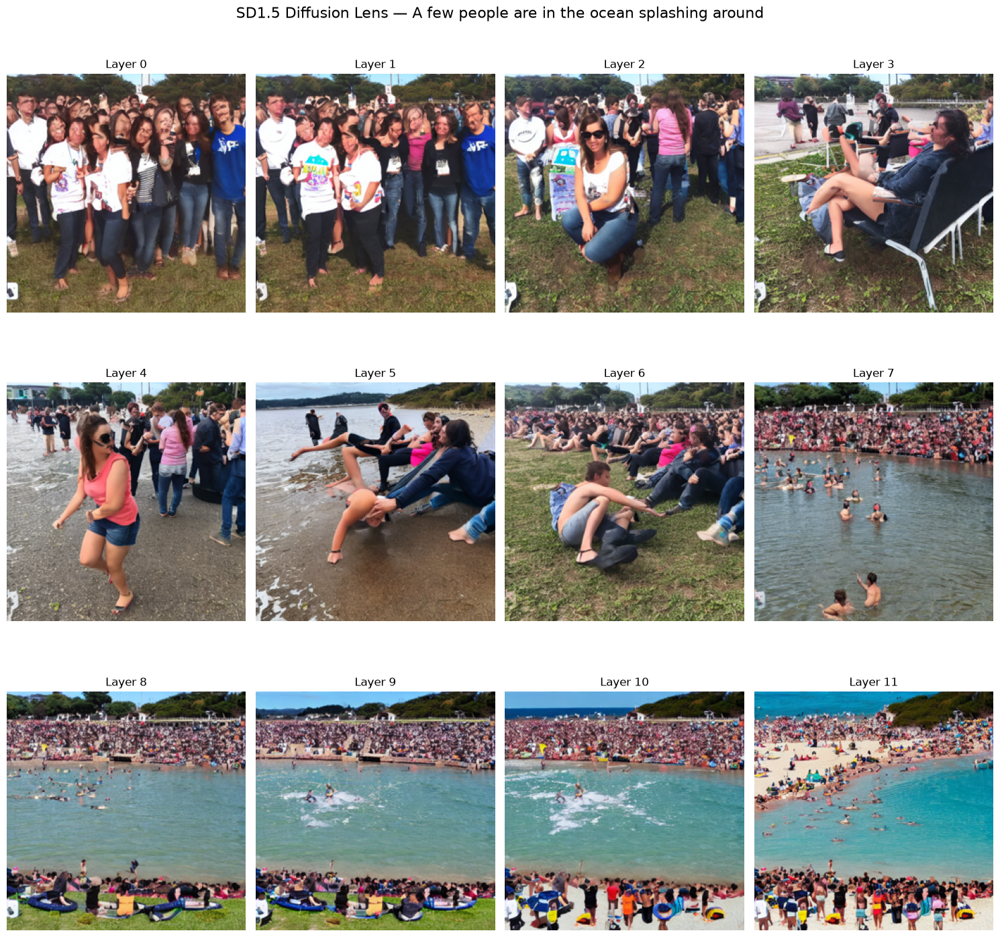

In [7]:
show_grid(images, layers, f"SD1.5 Diffusion Lens — {prompt}")

As reported in the paper, the CLIP encoder settles on the *people* (the first noun) in its earlier layers and only later fills in the *water/ocean* (the second noun). Next we'll look at a T5 encoder, which the paper found builds compound prompts in the opposite order.

## Deep Floyd (T5 encoder)

Deep Floyd IF is the T5-encoder model from the paper. **Its weights are gated on the Hugging Face Hub**: you must visit [DeepFloyd/IF-I-L-v1.0](https://huggingface.co/DeepFloyd/IF-I-L-v1.0), request access, and be logged in (`huggingface-cli login`) to download it. The cell below tries to load it and skips gracefully if you don't have access — the equivalent T5 behavior is demonstrated with FLUX further down.

T5 differs from CLIP in one structural detail that matters here: its encoder layers are `model.text_encoder.encoder.block`, and each block returns a **tuple**, so we take `.output[0]` to get the hidden state.

### Load Model

In [4]:
free_memory("model")

deepfloyd = None
try:
    deepfloyd = DiffusionModel(
        "DeepFloyd/IF-I-L-v1.0",
        torch_dtype=torch.float16,
        variant="fp16",
        safety_checker=None,
        dispatch=True,
    ).to("cuda")
    print("Deep Floyd loaded.")
except Exception as e:
    print(f"Skipping Deep Floyd — could not load it ({type(e).__name__}).")
    print("Request access at https://huggingface.co/DeepFloyd/IF-I-L-v1.0 and log in, then re-run.")


A mixture of fp16 and non-fp16 filenames will be loaded.
Loaded fp16 filenames:
[text_encoder/model.fp16-00002-of-00002.safetensors, safety_checker/model.fp16.safetensors, unet/diffusion_pytorch_model.fp16.safetensors, text_encoder/model.safetensors.index.fp16.json, text_encoder/pytorch_model.bin.index.fp16.json, text_encoder/model.fp16-00001-of-00002.safetensors]
Loaded non-fp16 filenames:
[watermarker/diffusion_pytorch_model.safetensors
If this behavior is not expected, please check your folder structure.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:  17%|█▋        | 1/6 [00:00<00:00,  9.64it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 27.00it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 24.71it/s]


You have disabled the safety checker for <class 'diffusers.pipelines.deepfloyd_if.pipeline_if.IFPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the IF license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Deep Floyd loaded.


In [9]:
DEEPFLOYD_SEED = 128998123
DEEPFLOYD_STEP_SIZE = 2

### Run Diffusion Lens

The intervention is the same as before — read an encoder layer, write it into the final layer norm — using T5's module names and tuple output.

In [6]:
import ftfy  # noqa: F401  (diffusers uses ftfy to clean the T5 prompt)

df_images = []
df_layers = []
if deepfloyd is not None:
    df_layers = range(0, deepfloyd.text_encoder.config.num_hidden_layers - 1, DEEPFLOYD_STEP_SIZE)
    for layer in df_layers:
        print(f"Generating from T5 layer {layer}")
        with deepfloyd.generate(prompt, num_inference_steps=50, seed=DEEPFLOYD_SEED):
            hidden_state = deepfloyd.text_encoder.encoder.block[layer].output[0]
            deepfloyd.text_encoder.encoder.final_layer_norm.input = hidden_state

            result = deepfloyd.output.save()
        df_images.append(result.images[0])

Generating from T5 layer 0


  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:00<00:19,  2.51it/s]

  8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

 14%|█▍        | 7/50 [00:00<00:03, 14.21it/s]

 20%|██        | 10/50 [00:00<00:02, 17.78it/s]

 26%|██▌       | 13/50 [00:00<00:01, 20.35it/s]

 32%|███▏      | 16/50 [00:00<00:01, 21.60it/s]

 38%|███▊      | 19/50 [00:01<00:01, 22.87it/s]

 44%|████▍     | 22/50 [00:01<00:01, 23.75it/s]

 50%|█████     | 25/50 [00:01<00:01, 24.40it/s]

 56%|█████▌    | 28/50 [00:01<00:00, 24.76it/s]

 62%|██████▏   | 31/50 [00:01<00:00, 25.11it/s]

 68%|██████▊   | 34/50 [00:01<00:00, 25.41it/s]

 74%|███████▍  | 37/50 [00:01<00:00, 25.72it/s]

 80%|████████  | 40/50 [00:01<00:00, 25.87it/s]

 86%|████████▌ | 43/50 [00:02<00:00, 25.80it/s]

 92%|█████████▏| 46/50 [00:02<00:00, 25.82it/s]

 98%|█████████▊| 49/50 [00:02<00:00, 25.53it/s]

100%|██████████| 50/50 [00:02<00:00, 21.76it/s]

Generating from T5 layer 2


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 25.43it/s]

 12%|█▏        | 6/50 [00:00<00:01, 25.35it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.34it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.59it/s]

 30%|███       | 15/50 [00:00<00:01, 25.44it/s]

 36%|███▌      | 18/50 [00:00<00:01, 24.68it/s]

 42%|████▏     | 21/50 [00:00<00:01, 24.60it/s]

 48%|████▊     | 24/50 [00:00<00:01, 23.89it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.20it/s]

 60%|██████    | 30/50 [00:01<00:00, 24.83it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 25.17it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 24.89it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.43it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 23.73it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.21it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 24.52it/s]

100%|██████████| 50/50 [00:02<00:00, 24.70it/s]

Generating from T5 layer 4


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 24.64it/s]

 12%|█▏        | 6/50 [00:00<00:01, 25.22it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.50it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.02it/s]

 30%|███       | 15/50 [00:00<00:01, 25.14it/s]

 36%|███▌      | 18/50 [00:00<00:01, 25.49it/s]

 42%|████▏     | 21/50 [00:00<00:01, 25.48it/s]

 48%|████▊     | 24/50 [00:00<00:01, 25.57it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 25.79it/s]

 60%|██████    | 30/50 [00:01<00:00, 25.79it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 25.87it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 25.86it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 25.16it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 25.50it/s]

 90%|█████████ | 45/50 [00:01<00:00, 25.79it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 26.06it/s]

100%|██████████| 50/50 [00:01<00:00, 25.59it/s]

Generating from T5 layer 6


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 23.72it/s]

 12%|█▏        | 6/50 [00:00<00:01, 25.21it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.84it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.44it/s]

 30%|███       | 15/50 [00:00<00:01, 25.53it/s]

 36%|███▌      | 18/50 [00:00<00:01, 25.49it/s]

 42%|████▏     | 21/50 [00:00<00:01, 24.97it/s]

 48%|████▊     | 24/50 [00:00<00:01, 24.80it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.97it/s]

 60%|██████    | 30/50 [00:01<00:00, 24.93it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 25.19it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 25.29it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.81it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 25.09it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.72it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 24.68it/s]

100%|██████████| 50/50 [00:01<00:00, 25.05it/s]

Generating from T5 layer 8


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 24.60it/s]

 12%|█▏        | 6/50 [00:00<00:01, 25.08it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.28it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.08it/s]

 30%|███       | 15/50 [00:00<00:01, 25.24it/s]

 36%|███▌      | 18/50 [00:00<00:01, 24.98it/s]

 42%|████▏     | 21/50 [00:00<00:01, 24.94it/s]

 48%|████▊     | 24/50 [00:00<00:01, 25.11it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 25.26it/s]

 60%|██████    | 30/50 [00:01<00:00, 25.43it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 25.35it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 25.27it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.99it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 25.02it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.63it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 24.61it/s]

100%|██████████| 50/50 [00:02<00:00, 24.94it/s]

Generating from T5 layer 10


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 25.29it/s]

 12%|█▏        | 6/50 [00:00<00:01, 24.88it/s]

 18%|█▊        | 9/50 [00:00<00:01, 24.49it/s]

 24%|██▍       | 12/50 [00:00<00:01, 24.86it/s]

 30%|███       | 15/50 [00:00<00:01, 24.57it/s]

 36%|███▌      | 18/50 [00:00<00:01, 24.74it/s]

 42%|████▏     | 21/50 [00:00<00:01, 25.18it/s]

 48%|████▊     | 24/50 [00:00<00:01, 24.89it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 25.09it/s]

 60%|██████    | 30/50 [00:01<00:00, 25.46it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 25.59it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 25.81it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 25.95it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 25.01it/s]

 90%|█████████ | 45/50 [00:01<00:00, 25.22it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 25.21it/s]

100%|██████████| 50/50 [00:01<00:00, 25.15it/s]

Generating from T5 layer 12


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 24.80it/s]

 12%|█▏        | 6/50 [00:00<00:01, 25.34it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.03it/s]

 24%|██▍       | 12/50 [00:00<00:01, 24.92it/s]

 30%|███       | 15/50 [00:00<00:01, 24.77it/s]

 36%|███▌      | 18/50 [00:00<00:01, 24.49it/s]

 42%|████▏     | 21/50 [00:00<00:01, 24.55it/s]

 48%|████▊     | 24/50 [00:00<00:01, 24.62it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.85it/s]

 60%|██████    | 30/50 [00:01<00:00, 25.03it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 24.98it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 24.97it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 25.02it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 24.53it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.64it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 24.72it/s]

100%|██████████| 50/50 [00:02<00:00, 24.84it/s]

Generating from T5 layer 14


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 25.96it/s]

 12%|█▏        | 6/50 [00:00<00:01, 25.89it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.59it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.20it/s]

 30%|███       | 15/50 [00:00<00:01, 25.15it/s]

 36%|███▌      | 18/50 [00:00<00:01, 25.14it/s]

 42%|████▏     | 21/50 [00:00<00:01, 25.01it/s]

 48%|████▊     | 24/50 [00:00<00:01, 25.16it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.74it/s]

 60%|██████    | 30/50 [00:01<00:00, 24.92it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 23.86it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 24.06it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.31it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 24.68it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.42it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 24.52it/s]

100%|██████████| 50/50 [00:02<00:00, 24.75it/s]

Generating from T5 layer 16


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 25.19it/s]

 12%|█▏        | 6/50 [00:00<00:01, 24.98it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.04it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.07it/s]

 30%|███       | 15/50 [00:00<00:01, 24.79it/s]

 36%|███▌      | 18/50 [00:00<00:01, 24.86it/s]

 42%|████▏     | 21/50 [00:00<00:01, 25.06it/s]

 48%|████▊     | 24/50 [00:00<00:01, 24.97it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.68it/s]

 60%|██████    | 30/50 [00:01<00:00, 24.88it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 24.98it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 24.96it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.83it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 24.80it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.91it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 25.05it/s]

100%|██████████| 50/50 [00:02<00:00, 24.98it/s]

Generating from T5 layer 18


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 24.02it/s]

 12%|█▏        | 6/50 [00:00<00:01, 24.58it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.05it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.38it/s]

 30%|███       | 15/50 [00:00<00:01, 25.36it/s]

 36%|███▌      | 18/50 [00:00<00:01, 24.69it/s]

 42%|████▏     | 21/50 [00:00<00:01, 24.65it/s]

 48%|████▊     | 24/50 [00:00<00:01, 24.67it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.16it/s]

 60%|██████    | 30/50 [00:01<00:00, 23.35it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 23.55it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 24.03it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 24.45it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 24.70it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.71it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 24.78it/s]

100%|██████████| 50/50 [00:02<00:00, 24.55it/s]

Generating from T5 layer 20


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 24.32it/s]

 12%|█▏        | 6/50 [00:00<00:01, 24.59it/s]

 18%|█▊        | 9/50 [00:00<00:01, 25.07it/s]

 24%|██▍       | 12/50 [00:00<00:01, 25.00it/s]

 30%|███       | 15/50 [00:00<00:01, 25.00it/s]

 36%|███▌      | 18/50 [00:00<00:01, 25.33it/s]

 42%|████▏     | 21/50 [00:00<00:01, 25.19it/s]

 48%|████▊     | 24/50 [00:00<00:01, 24.87it/s]

 54%|█████▍    | 27/50 [00:01<00:00, 24.93it/s]

 60%|██████    | 30/50 [00:01<00:00, 24.93it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 25.10it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 25.26it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 25.44it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 25.48it/s]

 90%|█████████ | 45/50 [00:01<00:00, 24.04it/s]

 96%|█████████▌| 48/50 [00:01<00:00, 23.35it/s]

100%|██████████| 50/50 [00:02<00:00, 24.64it/s]

Generating from T5 layer 22


  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:00<00:01, 23.61it/s]

 12%|█▏        | 6/50 [00:00<00:01, 23.60it/s]

 18%|█▊        | 9/50 [00:00<00:01, 23.60it/s]

 24%|██▍       | 12/50 [00:00<00:01, 23.81it/s]

 30%|███       | 15/50 [00:00<00:01, 23.32it/s]

 36%|███▌      | 18/50 [00:00<00:01, 23.07it/s]

 42%|████▏     | 21/50 [00:00<00:01, 23.19it/s]

 48%|████▊     | 24/50 [00:01<00:01, 22.71it/s]

 54%|█████▍    | 27/50 [00:01<00:01, 22.61it/s]

 60%|██████    | 30/50 [00:01<00:00, 22.21it/s]

 66%|██████▌   | 33/50 [00:01<00:00, 21.84it/s]

 72%|███████▏  | 36/50 [00:01<00:00, 22.08it/s]

 78%|███████▊  | 39/50 [00:01<00:00, 22.54it/s]

 84%|████████▍ | 42/50 [00:01<00:00, 23.16it/s]

 90%|█████████ | 45/50 [00:01<00:00, 23.80it/s]

 96%|█████████▌| 48/50 [00:02<00:00, 24.13it/s]

100%|██████████| 50/50 [00:02<00:00, 23.22it/s]

### Visualize Results

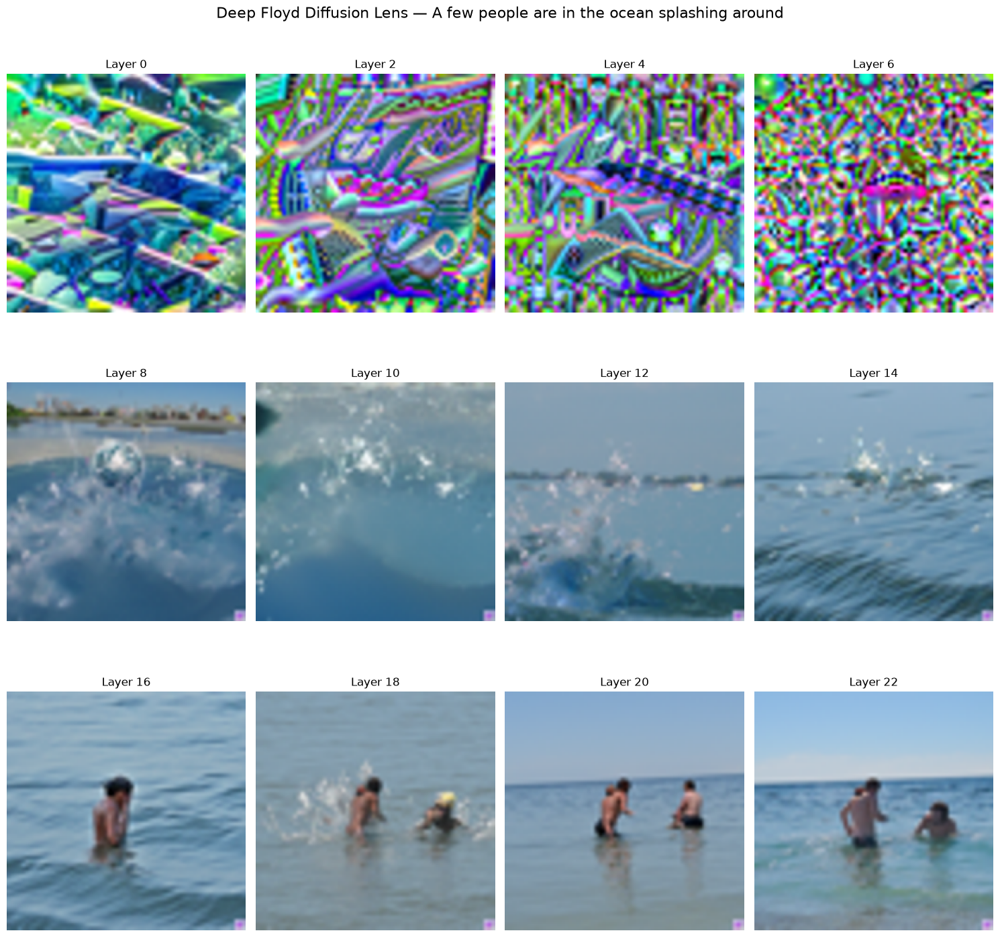

In [7]:
show_grid(df_images, list(df_layers), f"Deep Floyd Diffusion Lens — {prompt}")

When it runs, the T5 encoder starts with the *ocean* (the second noun) and adds the *people* later — the reverse of CLIP's order, exactly the contrast the paper highlights.

## BONUS: Stable Diffusion XL (Two CLIP encoders)

### Load Model

SDXL uses **two** CLIP encoders and conditions the denoiser on the second one's *penultimate* hidden state. To isolate the second encoder we feed the first an empty prompt, and because SDXL uses a hidden state from before the final norm, we apply that norm ourselves. The second encoder is a `CLIPTextModelWithProjection`, so its CLIP stack sits under `.text_model` (`model.text_encoder_2.text_model.encoder.layers`).

In [12]:
free_memory("deepfloyd")

model = DiffusionModel(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
    dispatch=True,
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:  29%|██▊       | 2/7 [00:00<00:00, 12.34it/s]

Loading pipeline components...:  86%|████████▌ | 6/7 [00:00<00:00, 22.08it/s]

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 16.01it/s]

In [13]:
ADD_LAYER_NORM = True   # SDXL uses a pre-norm hidden state, so we apply the norm ourselves
SEED = 17
STEP_SIZE = 4

### Run Diffusion Lens

We build an empty-prompt input for the first encoder to mask it out, then for each layer of the second encoder we overwrite the penultimate layer's output (the one SDXL actually reads) with our chosen layer's hidden state — passed through the final layer norm when `ADD_LAYER_NORM` is on. Try setting `ADD_LAYER_NORM = False` to see how much that norm matters.

In [14]:
tokenizer = model.pipeline.tokenizer  # tokenizers aren't nn.Modules, so reach them on the pipeline

# Empty prompt to nullify the first text encoder's contribution.
mask_input = tokenizer(
    "",
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
).to(model.device)

layers = range(0, model.text_encoder_2.config.num_hidden_layers - 1, STEP_SIZE)
images = []

enc2 = model.text_encoder_2.text_model
for layer in layers:
    print(f"Generating from CLIP-2 layer {layer}")
    with model.generate(prompt, num_inference_steps=25, seed=SEED):
        # Mask the first encoder.
        model.text_encoder.input = mask_input["input_ids"]

        hidden_state = enc2.encoder.layers[layer].output
        if ADD_LAYER_NORM:
            hidden_state = enc2.final_layer_norm(hidden_state)
        # SDXL reads the penultimate layer's output — overwrite it with our layer.
        enc2.encoder.layers[-2].output = hidden_state

        result = model.output.save()
    images.append(result.images[0])

Generating from CLIP-2 layer 0


  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 1/25 [00:00<00:04,  4.88it/s]

 12%|█▏        | 3/25 [00:00<00:03,  6.45it/s]

 16%|█▌        | 4/25 [00:00<00:03,  6.02it/s]

 20%|██        | 5/25 [00:00<00:03,  5.79it/s]

 24%|██▍       | 6/25 [00:01<00:03,  5.61it/s]

 28%|██▊       | 7/25 [00:01<00:03,  5.51it/s]

 32%|███▏      | 8/25 [00:01<00:03,  5.46it/s]

 36%|███▌      | 9/25 [00:01<00:02,  5.42it/s]

 40%|████      | 10/25 [00:01<00:02,  5.40it/s]

 44%|████▍     | 11/25 [00:01<00:02,  5.37it/s]

 48%|████▊     | 12/25 [00:02<00:02,  5.35it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  5.34it/s]

 56%|█████▌    | 14/25 [00:02<00:02,  5.34it/s]

 60%|██████    | 15/25 [00:02<00:01,  5.34it/s]

 64%|██████▍   | 16/25 [00:02<00:01,  5.33it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  5.32it/s]

 72%|███████▏  | 18/25 [00:03<00:01,  5.32it/s]

 76%|███████▌  | 19/25 [00:03<00:01,  5.32it/s]

 80%|████████  | 20/25 [00:03<00:00,  5.32it/s]

 84%|████████▍ | 21/25 [00:03<00:00,  5.32it/s]

 88%|████████▊ | 22/25 [00:04<00:00,  5.32it/s]

 92%|█████████▏| 23/25 [00:04<00:00,  5.31it/s]

 96%|█████████▌| 24/25 [00:04<00:00,  5.31it/s]

100%|██████████| 25/25 [00:04<00:00,  5.32it/s]

100%|██████████| 25/25 [00:04<00:00,  5.42it/s]


/home/localjadenfk/miniconda3/envs/ndif2/lib/python3.12/site-packages/diffusers/pipelines/stable_diffusion_xl/pipeline_stable_diffusion_xl.py:748: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(
There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 4


  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 2/25 [00:00<00:03,  7.26it/s]

 12%|█▏        | 3/25 [00:00<00:03,  6.31it/s]

 16%|█▌        | 4/25 [00:00<00:03,  5.90it/s]

 20%|██        | 5/25 [00:00<00:03,  5.69it/s]

 24%|██▍       | 6/25 [00:01<00:03,  5.53it/s]

 28%|██▊       | 7/25 [00:01<00:03,  5.46it/s]

 32%|███▏      | 8/25 [00:01<00:03,  5.42it/s]

 36%|███▌      | 9/25 [00:01<00:02,  5.39it/s]

 40%|████      | 10/25 [00:01<00:02,  5.36it/s]

 44%|████▍     | 11/25 [00:01<00:02,  5.33it/s]

 48%|████▊     | 12/25 [00:02<00:02,  5.32it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  5.32it/s]

 56%|█████▌    | 14/25 [00:02<00:02,  5.33it/s]

 60%|██████    | 15/25 [00:02<00:01,  5.32it/s]

 64%|██████▍   | 16/25 [00:02<00:01,  5.31it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  5.30it/s]

 72%|███████▏  | 18/25 [00:03<00:01,  5.30it/s]

 76%|███████▌  | 19/25 [00:03<00:01,  5.31it/s]

 80%|████████  | 20/25 [00:03<00:00,  5.31it/s]

 84%|████████▍ | 21/25 [00:03<00:00,  5.30it/s]

 88%|████████▊ | 22/25 [00:04<00:00,  5.30it/s]

 92%|█████████▏| 23/25 [00:04<00:00,  5.30it/s]

 96%|█████████▌| 24/25 [00:04<00:00,  5.30it/s]

100%|██████████| 25/25 [00:04<00:00,  5.31it/s]

100%|██████████| 25/25 [00:04<00:00,  5.42it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 8


  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 2/25 [00:00<00:03,  7.25it/s]

 12%|█▏        | 3/25 [00:00<00:03,  6.31it/s]

 16%|█▌        | 4/25 [00:00<00:03,  5.89it/s]

 20%|██        | 5/25 [00:00<00:03,  5.68it/s]

 24%|██▍       | 6/25 [00:01<00:03,  5.51it/s]

 28%|██▊       | 7/25 [00:01<00:03,  5.44it/s]

 32%|███▏      | 8/25 [00:01<00:03,  5.40it/s]

 36%|███▌      | 9/25 [00:01<00:02,  5.38it/s]

 40%|████      | 10/25 [00:01<00:02,  5.36it/s]

 44%|████▍     | 11/25 [00:01<00:02,  5.32it/s]

 48%|████▊     | 12/25 [00:02<00:02,  5.31it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  5.30it/s]

 56%|█████▌    | 14/25 [00:02<00:02,  5.31it/s]

 60%|██████    | 15/25 [00:02<00:01,  5.31it/s]

 64%|██████▍   | 16/25 [00:02<00:01,  5.30it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  5.29it/s]

 72%|███████▏  | 18/25 [00:03<00:01,  5.29it/s]

 76%|███████▌  | 19/25 [00:03<00:01,  5.30it/s]

 80%|████████  | 20/25 [00:03<00:00,  5.30it/s]

 84%|████████▍ | 21/25 [00:03<00:00,  5.29it/s]

 88%|████████▊ | 22/25 [00:04<00:00,  5.29it/s]

 92%|█████████▏| 23/25 [00:04<00:00,  5.28it/s]

 96%|█████████▌| 24/25 [00:04<00:00,  5.29it/s]

100%|██████████| 25/25 [00:04<00:00,  5.30it/s]

100%|██████████| 25/25 [00:04<00:00,  5.41it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 12


  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 2/25 [00:00<00:03,  7.27it/s]

 12%|█▏        | 3/25 [00:00<00:03,  6.30it/s]

 16%|█▌        | 4/25 [00:00<00:03,  5.90it/s]

 20%|██        | 5/25 [00:00<00:03,  5.68it/s]

 24%|██▍       | 6/25 [00:01<00:03,  5.50it/s]

 28%|██▊       | 7/25 [00:01<00:03,  5.44it/s]

 32%|███▏      | 8/25 [00:01<00:03,  5.40it/s]

 36%|███▌      | 9/25 [00:01<00:02,  5.36it/s]

 40%|████      | 10/25 [00:01<00:02,  5.34it/s]

 44%|████▍     | 11/25 [00:01<00:02,  5.31it/s]

 48%|████▊     | 12/25 [00:02<00:02,  5.30it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  5.30it/s]

 56%|█████▌    | 14/25 [00:02<00:02,  5.30it/s]

 60%|██████    | 15/25 [00:02<00:01,  5.29it/s]

 64%|██████▍   | 16/25 [00:02<00:01,  5.28it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  5.28it/s]

 72%|███████▏  | 18/25 [00:03<00:01,  5.28it/s]

 76%|███████▌  | 19/25 [00:03<00:01,  5.29it/s]

 80%|████████  | 20/25 [00:03<00:00,  5.29it/s]

 84%|████████▍ | 21/25 [00:03<00:00,  5.27it/s]

 88%|████████▊ | 22/25 [00:04<00:00,  5.27it/s]

 92%|█████████▏| 23/25 [00:04<00:00,  5.27it/s]

 96%|█████████▌| 24/25 [00:04<00:00,  5.28it/s]

100%|██████████| 25/25 [00:04<00:00,  5.27it/s]

100%|██████████| 25/25 [00:04<00:00,  5.40it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 16


  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 2/25 [00:00<00:03,  7.23it/s]

 12%|█▏        | 3/25 [00:00<00:03,  6.28it/s]

 16%|█▌        | 4/25 [00:00<00:03,  5.88it/s]

 20%|██        | 5/25 [00:00<00:03,  5.66it/s]

 24%|██▍       | 6/25 [00:01<00:03,  5.48it/s]

 28%|██▊       | 7/25 [00:01<00:03,  5.41it/s]

 32%|███▏      | 8/25 [00:01<00:03,  5.37it/s]

 36%|███▌      | 9/25 [00:01<00:02,  5.34it/s]

 40%|████      | 10/25 [00:01<00:02,  5.32it/s]

 44%|████▍     | 11/25 [00:01<00:02,  5.30it/s]

 48%|████▊     | 12/25 [00:02<00:02,  5.29it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  5.28it/s]

 56%|█████▌    | 14/25 [00:02<00:02,  5.28it/s]

 60%|██████    | 15/25 [00:02<00:01,  5.28it/s]

 64%|██████▍   | 16/25 [00:02<00:01,  5.27it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  5.27it/s]

 72%|███████▏  | 18/25 [00:03<00:01,  5.26it/s]

 76%|███████▌  | 19/25 [00:03<00:01,  5.27it/s]

 80%|████████  | 20/25 [00:03<00:00,  5.27it/s]

 84%|████████▍ | 21/25 [00:03<00:00,  5.27it/s]

 88%|████████▊ | 22/25 [00:04<00:00,  5.26it/s]

 92%|█████████▏| 23/25 [00:04<00:00,  5.15it/s]

 96%|█████████▌| 24/25 [00:04<00:00,  5.13it/s]

100%|██████████| 25/25 [00:04<00:00,  5.17it/s]

100%|██████████| 25/25 [00:04<00:00,  5.36it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 20


  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 2/25 [00:00<00:03,  7.22it/s]

 12%|█▏        | 3/25 [00:00<00:03,  6.24it/s]

 16%|█▌        | 4/25 [00:00<00:03,  5.85it/s]

 20%|██        | 5/25 [00:00<00:03,  5.63it/s]

 24%|██▍       | 6/25 [00:01<00:03,  5.47it/s]

 28%|██▊       | 7/25 [00:01<00:03,  5.40it/s]

 32%|███▏      | 8/25 [00:01<00:03,  5.37it/s]

 36%|███▌      | 9/25 [00:01<00:02,  5.34it/s]

 40%|████      | 10/25 [00:01<00:02,  5.32it/s]

 44%|████▍     | 11/25 [00:02<00:02,  5.09it/s]

 48%|████▊     | 12/25 [00:02<00:02,  4.80it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  4.61it/s]

 56%|█████▌    | 14/25 [00:02<00:02,  4.47it/s]

 60%|██████    | 15/25 [00:02<00:02,  4.40it/s]

 64%|██████▍   | 16/25 [00:03<00:02,  4.35it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  4.33it/s]

 72%|███████▏  | 18/25 [00:03<00:01,  4.31it/s]

 76%|███████▌  | 19/25 [00:03<00:01,  4.30it/s]

 80%|████████  | 20/25 [00:04<00:01,  4.26it/s]

 84%|████████▍ | 21/25 [00:04<00:00,  4.25it/s]

 88%|████████▊ | 22/25 [00:04<00:00,  4.23it/s]

 92%|█████████▏| 23/25 [00:04<00:00,  4.23it/s]

 96%|█████████▌| 24/25 [00:05<00:00,  4.24it/s]

100%|██████████| 25/25 [00:05<00:00,  4.22it/s]

100%|██████████| 25/25 [00:05<00:00,  4.69it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 24


  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 1/25 [00:00<00:02,  9.09it/s]

  8%|▊         | 2/25 [00:00<00:04,  5.40it/s]

 12%|█▏        | 3/25 [00:00<00:04,  4.78it/s]

 16%|█▌        | 4/25 [00:00<00:04,  4.56it/s]

 20%|██        | 5/25 [00:01<00:04,  4.42it/s]

 24%|██▍       | 6/25 [00:01<00:04,  4.34it/s]

 28%|██▊       | 7/25 [00:01<00:04,  4.32it/s]

 32%|███▏      | 8/25 [00:01<00:03,  4.28it/s]

 36%|███▌      | 9/25 [00:02<00:03,  4.27it/s]

 40%|████      | 10/25 [00:02<00:03,  4.27it/s]

 44%|████▍     | 11/25 [00:02<00:03,  4.26it/s]

 48%|████▊     | 12/25 [00:02<00:03,  4.26it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  4.26it/s]

 56%|█████▌    | 14/25 [00:03<00:02,  4.23it/s]

 60%|██████    | 15/25 [00:03<00:02,  4.25it/s]

 64%|██████▍   | 16/25 [00:03<00:02,  4.24it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  4.24it/s]

 72%|███████▏  | 18/25 [00:04<00:01,  4.22it/s]

 76%|███████▌  | 19/25 [00:04<00:01,  4.23it/s]

 80%|████████  | 20/25 [00:04<00:01,  4.25it/s]

 84%|████████▍ | 21/25 [00:04<00:00,  4.23it/s]

 88%|████████▊ | 22/25 [00:05<00:00,  4.22it/s]

 92%|█████████▏| 23/25 [00:05<00:00,  4.21it/s]

 96%|█████████▌| 24/25 [00:05<00:00,  4.23it/s]

100%|██████████| 25/25 [00:05<00:00,  4.23it/s]

100%|██████████| 25/25 [00:05<00:00,  4.32it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


Generating from CLIP-2 layer 28


  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 1/25 [00:00<00:02,  8.92it/s]

  8%|▊         | 2/25 [00:00<00:04,  5.35it/s]

 12%|█▏        | 3/25 [00:00<00:04,  4.74it/s]

 16%|█▌        | 4/25 [00:00<00:04,  4.53it/s]

 20%|██        | 5/25 [00:01<00:04,  4.39it/s]

 24%|██▍       | 6/25 [00:01<00:04,  4.35it/s]

 28%|██▊       | 7/25 [00:01<00:04,  4.31it/s]

 32%|███▏      | 8/25 [00:01<00:03,  4.27it/s]

 36%|███▌      | 9/25 [00:02<00:03,  4.24it/s]

 40%|████      | 10/25 [00:02<00:03,  4.21it/s]

 44%|████▍     | 11/25 [00:02<00:03,  4.24it/s]

 48%|████▊     | 12/25 [00:02<00:03,  4.23it/s]

 52%|█████▏    | 13/25 [00:02<00:02,  4.22it/s]

 56%|█████▌    | 14/25 [00:03<00:02,  4.20it/s]

 60%|██████    | 15/25 [00:03<00:02,  4.21it/s]

 64%|██████▍   | 16/25 [00:03<00:02,  4.21it/s]

 68%|██████▊   | 17/25 [00:03<00:01,  4.20it/s]

 72%|███████▏  | 18/25 [00:04<00:01,  4.20it/s]

 76%|███████▌  | 19/25 [00:04<00:01,  4.22it/s]

 80%|████████  | 20/25 [00:04<00:01,  4.22it/s]

 84%|████████▍ | 21/25 [00:04<00:00,  4.22it/s]

 88%|████████▊ | 22/25 [00:05<00:00,  4.22it/s]

 92%|█████████▏| 23/25 [00:05<00:00,  4.23it/s]

 96%|█████████▌| 24/25 [00:05<00:00,  4.22it/s]

100%|██████████| 25/25 [00:05<00:00,  4.21it/s]

100%|██████████| 25/25 [00:05<00:00,  4.30it/s]


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


### Visualize Results

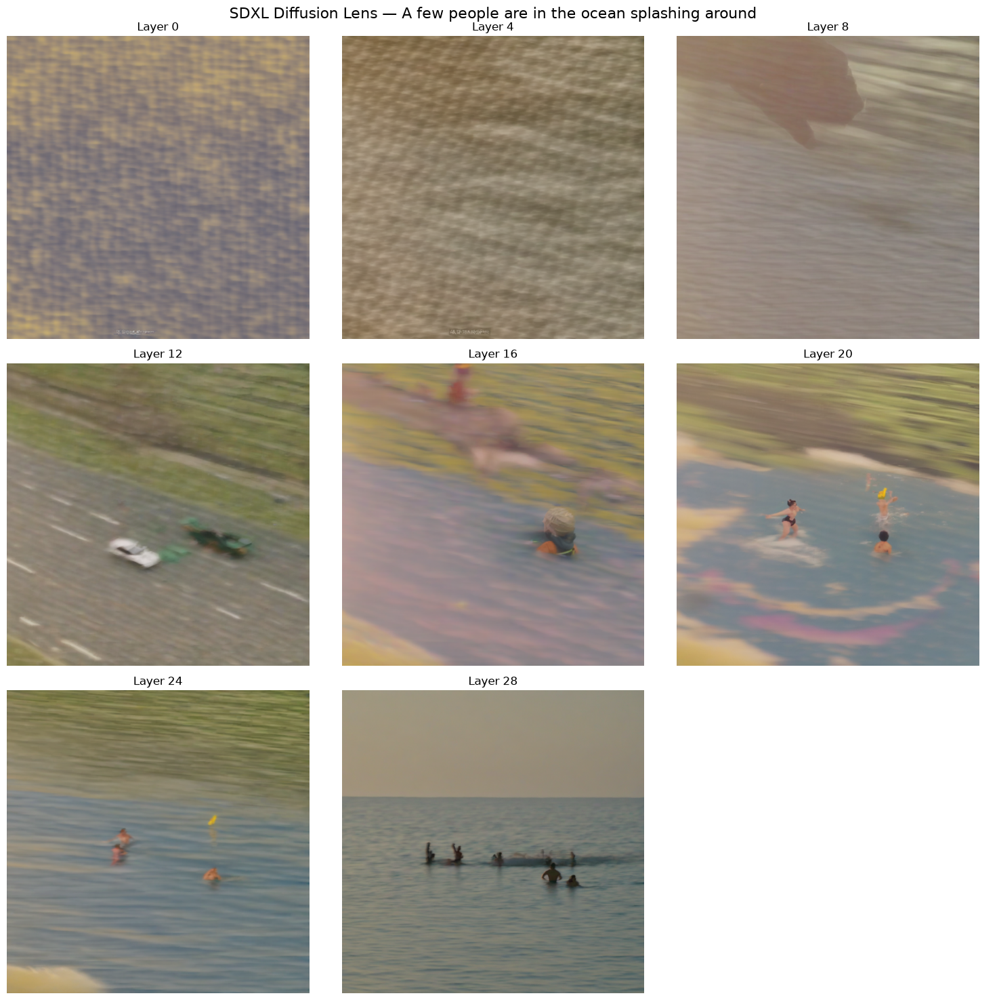

In [15]:
show_grid(images, layers, f"SDXL Diffusion Lens — {prompt}", thumb=512)

SDXL's second CLIP encoder builds the scene from a coarse layout in the early layers to a detailed image by the deep layers. Flip `ADD_LAYER_NORM` off and re-run to watch the early images degrade — the final norm does real work in making an intermediate embedding legible to the denoiser.

## BONUS: FLUX Schnell (CLIP and T5 XXL encoders)

### Load Model

FLUX pairs a CLIP encoder with a large T5-XXL encoder, and the T5 embedding carries most of the prompt's meaning. FLUX Schnell is distilled to generate in a single step (`num_inference_steps=1`, `guidance_scale=0.0`), which makes a per-layer sweep cheap. It is a large model — you'll want a GPU with plenty of memory.

In [16]:
free_memory("model")

model = DiffusionModel(
    "black-forest-labs/FLUX.1-schnell",
    torch_dtype=torch.bfloat16,
    dispatch=True,
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading checkpoint shards: 100%|██████████| 3/3 [00:00<00:00, 65.09it/s]


Loading pipeline components...:  29%|██▊       | 2/7 [00:00<00:00, 18.67it/s]

Loading pipeline components...:  71%|███████▏  | 5/7 [00:00<00:00, 23.14it/s]

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 19.84it/s]

In [17]:
prompt = "Penguin playing chess at a wooden table in a snowy landscape."
SEED = 17
STEP_SIZE = 2

### Run Diffusion Lens

CLIP is FLUX's first encoder and T5 its second; we mask CLIP with an empty prompt and lens the T5 stack (`model.text_encoder_2.encoder.block`, tuple output). This T5 prompt names three things — *penguin*, *table/chess*, and *snowy landscape* — so we can watch the order in which T5 introduces them.

In [18]:
tokenizer = model.pipeline.tokenizer

mask_input = tokenizer(
    "",
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
).to(model.device)

layers = range(0, model.text_encoder_2.config.num_hidden_layers - 1, STEP_SIZE)
images = []

for layer in layers:
    print(f"Generating from T5 layer {layer}")
    with model.generate(
        prompt,
        guidance_scale=0.0,
        height=512,
        width=512,
        num_inference_steps=1,
        seed=SEED,
    ):
        model.text_encoder.input = mask_input["input_ids"]
        model.text_encoder_2.encoder.final_layer_norm.input = (
            model.text_encoder_2.encoder.block[layer].output[0]
        )

        result = model.output.save()
    images.append(result.images[0])

Generating from T5 layer 0


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  5.92it/s]

100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

Generating from T5 layer 2


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.28it/s]

100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

Generating from T5 layer 4


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.28it/s]

100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

Generating from T5 layer 6


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

Generating from T5 layer 8


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

Generating from T5 layer 10


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

Generating from T5 layer 12


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

Generating from T5 layer 14


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

100%|██████████| 1/1 [00:00<00:00,  6.23it/s]

Generating from T5 layer 16


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

Generating from T5 layer 18


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.23it/s]

100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

Generating from T5 layer 20


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

Generating from T5 layer 22


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

### Visualize Results

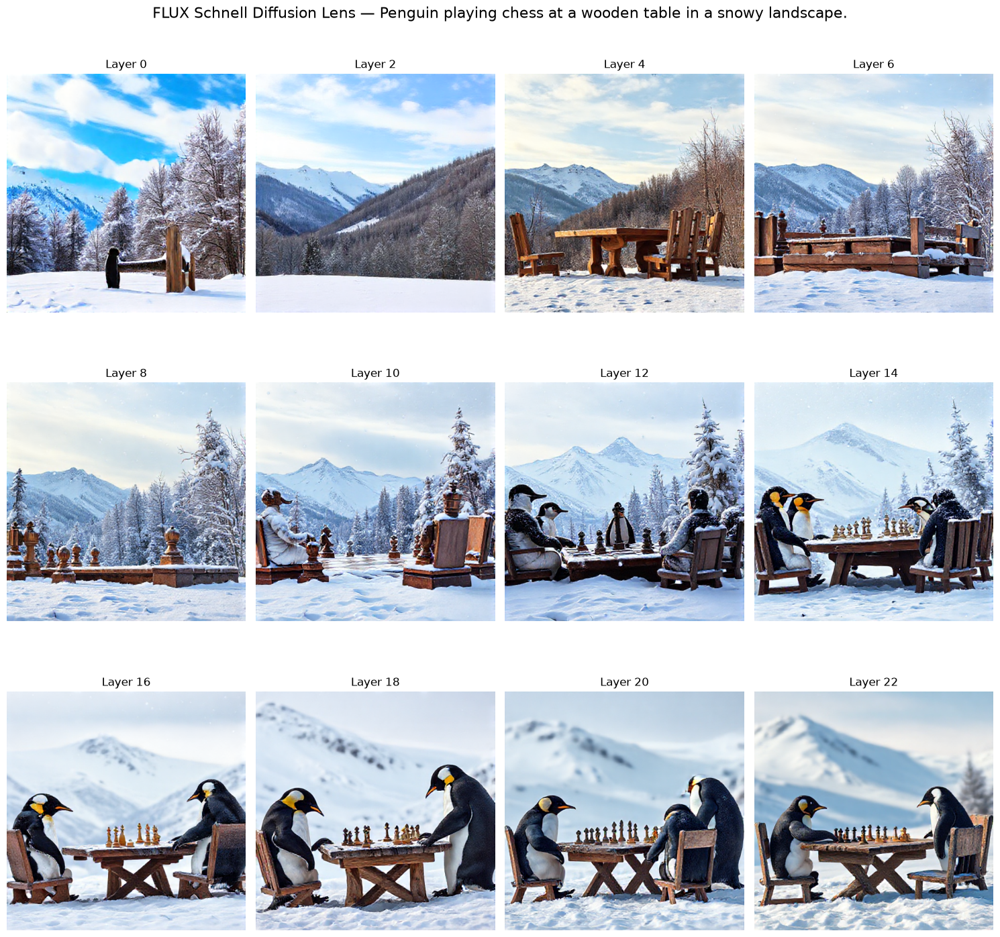

In [19]:
show_grid(images, layers, f"FLUX Schnell Diffusion Lens — {prompt}", thumb=512)

FLUX's T5 encoder lays down the snowy landscape first, then the table and chess board, and the penguins last — consistent with the paper's finding that T5 encoders tend to introduce a compound prompt's later nouns before its earlier ones.

## Where to Go Next

- The diffusion lens is the image-model cousin of the [logit lens](logit_lens.ipynb) — both decode a partial computation with the model's own later machinery.
- It's built entirely from [getting](../../../features/1_getting.ipynb) one module's output and [setting](../../../features/2_setting.ipynb) another's input; the [API reference](../../documentation/index.md) documents every module accessor used here.
- Swap in your own compound prompts, or try masking the *other* encoder in the SDXL/FLUX sections, to probe how each encoder divides up the work.